# Importing necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import os.path
from pathlib import Path
import glob
import cv2
from PIL import Image
import random
from sklearn.model_selection import train_test_split
import albumentations as A
from keras import backend as K
from keras.optimizers import Adam
from keras.callbacks import *
import tensorflow as tf
from tensorflow.keras.models import load_model, Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, BatchNormalization, Activation, Add,Dropout

# Importing the ADNI dataset

In [2]:
Label35_Path = Path(r"C:\Users\swarnadeep acharya\Downloads\ADNI hippocampus\label\35label")
Image35_Path = Path(r"C:\Users\swarnadeep acharya\Downloads\ADNI hippocampus\original\35")

In [3]:
Label_Path = list(Label35_Path.glob(r"**/*.jpg"))
Image_Path = list(Image35_Path.glob(r"**/*.jpg"))

In [4]:
Label_Series = pd.Series(Label_Path,name="LABEL").astype(str)
Image_Series = pd.Series(Image_Path,name="IMAGE").astype(str)

In [5]:
Label_Series

0        C:\Users\swarnadeep acharya\Downloads\ADNI hip...
1        C:\Users\swarnadeep acharya\Downloads\ADNI hip...
2        C:\Users\swarnadeep acharya\Downloads\ADNI hip...
3        C:\Users\swarnadeep acharya\Downloads\ADNI hip...
4        C:\Users\swarnadeep acharya\Downloads\ADNI hip...
                               ...                        
13225    C:\Users\swarnadeep acharya\Downloads\ADNI hip...
13226    C:\Users\swarnadeep acharya\Downloads\ADNI hip...
13227    C:\Users\swarnadeep acharya\Downloads\ADNI hip...
13228    C:\Users\swarnadeep acharya\Downloads\ADNI hip...
13229    C:\Users\swarnadeep acharya\Downloads\ADNI hip...
Name: LABEL, Length: 13230, dtype: object

# Splitting the folders to access images

In [6]:
Split_Params_For_LABEL = "35label\\"
Split_Params_For_IMG = "35\\"


L_Main_Path, L_Target_Path = Label_Series[0].split(Split_Params_For_LABEL)


I_Main_Path, I_Target_Path = Image_Series[0].split(Split_Params_For_IMG)

print("LABEL MAIN: ", L_Main_Path)
print("LABEL TARGET: ", L_Target_Path)
print("IMG MAIN: ", I_Main_Path)
print("IMG TARGET: ", I_Target_Path)

LABEL MAIN:  C:\Users\swarnadeep acharya\Downloads\ADNI hippocampus\label\
LABEL TARGET:  ADNI_002_S_0685_18211\ADNI_002_S_0685_18211_L\ADNI_002_S_0685_18211_L_001.jpg
IMG MAIN:  C:\Users\swarnadeep acharya\Downloads\ADNI hippocampus\original\
IMG TARGET:  ADNI_002_S_0685_18211_tal_noscale\ADNI_002_S_0685_18211_tal_noscale_001.jpg


In [7]:
Common_Params = "\\"

Label_Path_Before, Label_Path_Middle, Label_Path_After = L_Target_Path.split(Common_Params)

IMG_Path_Before, IMG_Path_After = I_Target_Path.split(Common_Params)


print("LABEL BEFORE: ", Label_Path_Before)
print("LABEL MIDDLE: ", Label_Path_Middle)
print("LABEL AFTER: ", Label_Path_After)
print("IMG BEFORE: ", IMG_Path_Before)
print("IMG AFTER: ", IMG_Path_After)

LABEL BEFORE:  ADNI_002_S_0685_18211
LABEL MIDDLE:  ADNI_002_S_0685_18211_L
LABEL AFTER:  ADNI_002_S_0685_18211_L_001.jpg
IMG BEFORE:  ADNI_002_S_0685_18211_tal_noscale
IMG AFTER:  ADNI_002_S_0685_18211_tal_noscale_001.jpg


In [8]:
List_Split_Params = "_"

Label_Path_Split = Label_Path_After.split(List_Split_Params)
IMG_Path_Split = IMG_Path_After.split(List_Split_Params)

print("LABEL LIST: ",Label_Path_Split)
print("IMG LIST: ",IMG_Path_Split)
print("LABEL TARGET: ",Label_Path_Split[-2])
print("IMG TARGET: ",IMG_Path_Split[-1])

LABEL LIST:  ['ADNI', '002', 'S', '0685', '18211', 'L', '001.jpg']
IMG LIST:  ['ADNI', '002', 'S', '0685', '18211', 'tal', 'noscale', '001.jpg']
LABEL TARGET:  L
IMG TARGET:  001.jpg


In [9]:
L_IMG35 = []
R_IMG35 = []
Total_IMG35 = []

Split_Params_For_LABEL = "35label\\"
Split_Params_For_IMG = "35\\"

Common_Params = "\\"
List_Split_Params = "_"
for label_x, image_x in zip(Label_Series, Image_Series):

    try:
        L_Main_Path, L_Target_Path = label_x.split(Split_Params_For_LABEL)
        I_Main_Path, I_Target_Path = image_x.split(Split_Params_For_IMG)

        Label_Path_Before, Label_Path_Middle, Label_Path_After = L_Target_Path.split(Common_Params)
        IMG_Path_Before, IMG_Path_After = I_Target_Path.split(Common_Params)
   
        Label_Path_Split = Label_Path_After.split(List_Split_Params)
        IMG_Path_Split = IMG_Path_After.split(List_Split_Params)

        if Label_Path_Split[-2] == "L":
            L_IMG35.append(label_x)
            Total_IMG35.append(image_x)

        elif Label_Path_Split[-2] == "R":
            Total_IMG35.append(image_x)
            R_IMG35.append(label_x)

    except:
        print("LABEL: ", label_x)
        print("IMG: ", image_x)

In [10]:
print("IMG :",len(Total_IMG35))
print("LABEL L:",len(L_IMG35))
print("LABEL R:",len(R_IMG35))

IMG : 6615
LABEL L: 3402
LABEL R: 3213


In [11]:
Sorted_L = sorted(L_IMG35)
Sorted_R = sorted(R_IMG35)
Sorted_IMG = sorted(Total_IMG35)

In [12]:
print(Sorted_L[1500])
print(Sorted_R[1500])
print(Sorted_IMG[1500])

C:\Users\swarnadeep acharya\Downloads\ADNI hippocampus\label\35label\ADNI_006_S_4449_279470_ACPC\ADNI_006_S_4449_279470_L\ADNI_006_S_4449_279470_L_178.jpg
C:\Users\swarnadeep acharya\Downloads\ADNI hippocampus\label\35label\ADNI_006_S_4449_279470_ACPC\ADNI_006_S_4449_279470_R\ADNI_006_S_4449_279470_R_178.jpg
C:\Users\swarnadeep acharya\Downloads\ADNI hippocampus\original\35\ADNI_006_S_4449_279470_ACPC\ADNI_006_S_4449_279470_ACPC_178.jpg


# Visualizing images from the dataset

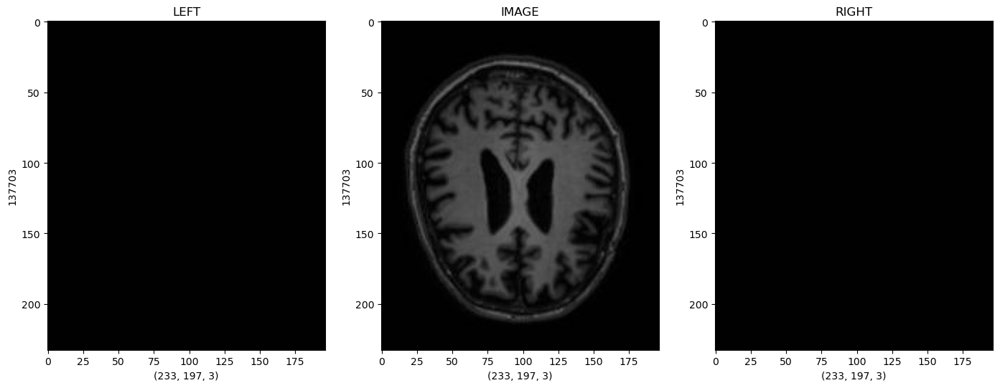

In [27]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[300]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[300]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[300]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)


axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

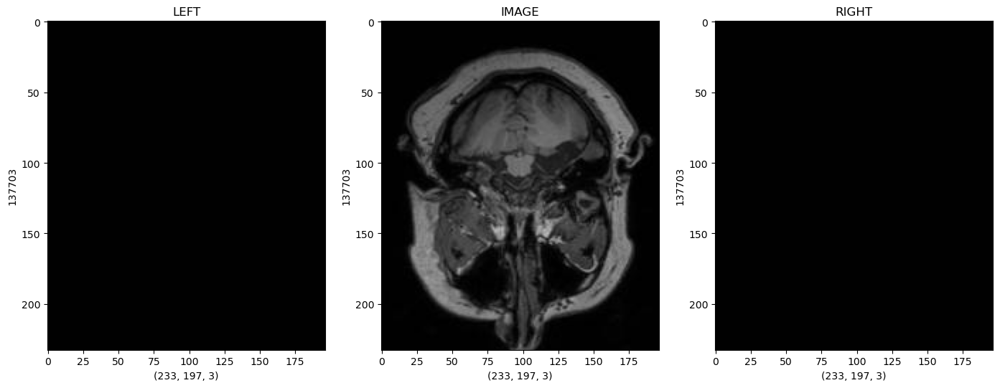

In [28]:
figure,axis = plt.subplots(1,3,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[800]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[800]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[800]),cv2.COLOR_BGR2RGB)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)


axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

<function matplotlib.pyplot.show(close=None, block=None)>

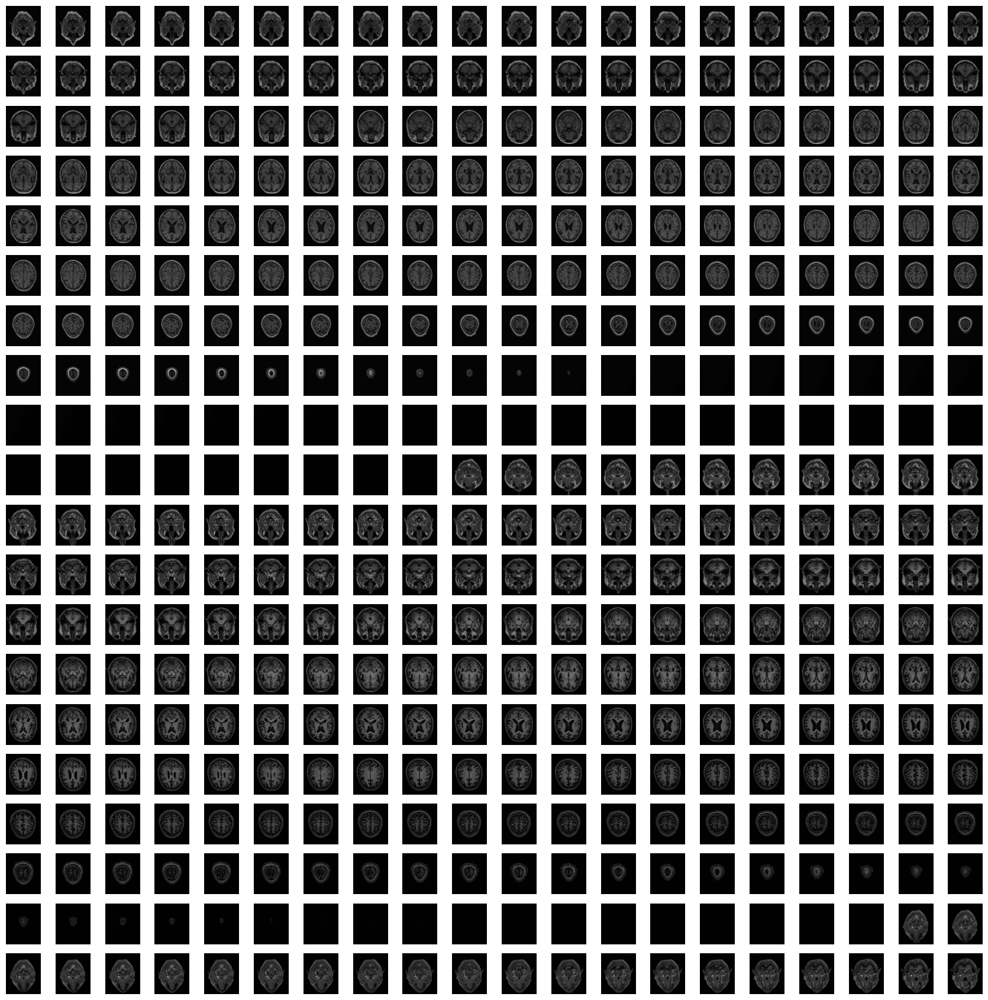

In [29]:
plt.style.use("default")
figure,axis = plt.subplots(20,20,figsize=(17,17))

for indexing,operations in enumerate(axis.flat):
    
    Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[indexing]),cv2.COLOR_BGR2RGB)
    
    operations.imshow(Example_IMG)
    operations.axis("off")

plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

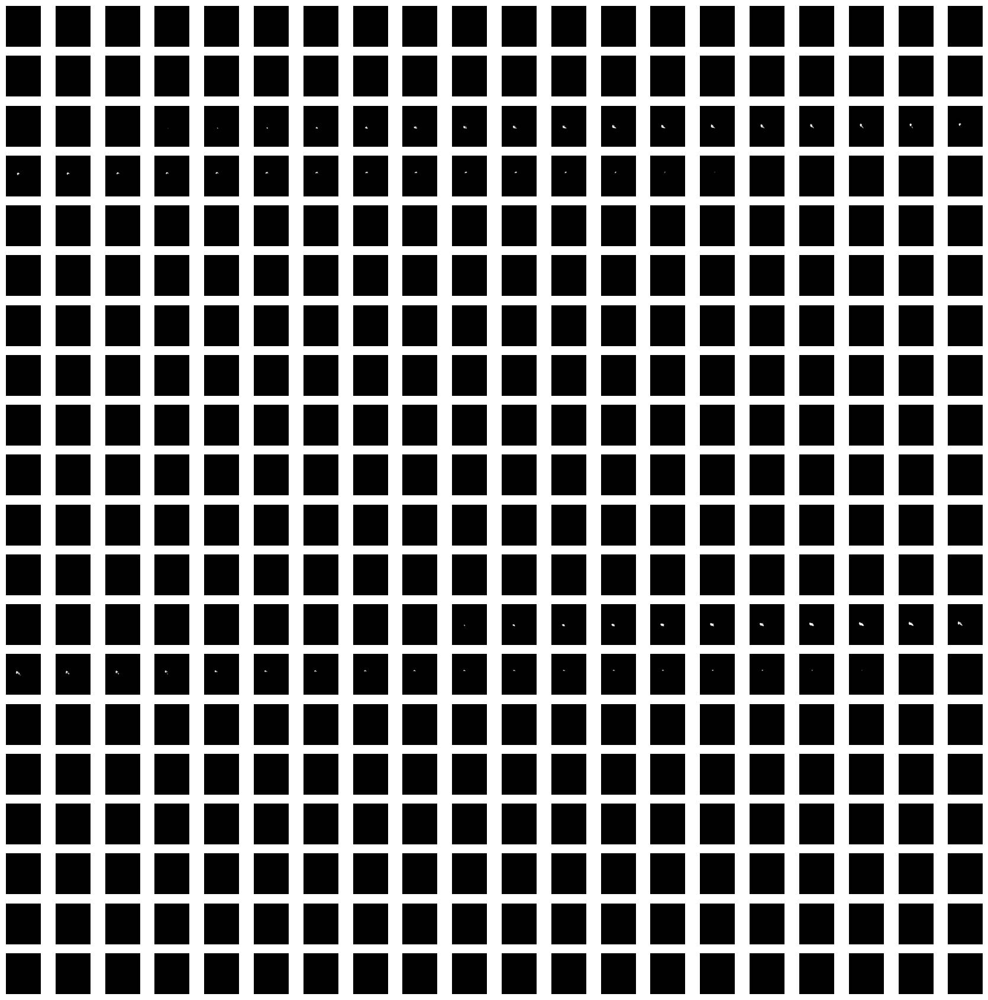

In [30]:
plt.style.use("default")
figure,axis = plt.subplots(20,20,figsize=(17,17))

for indexing,operations in enumerate(axis.flat):
    
    Example_IMG = cv2.cvtColor(cv2.imread(Sorted_L[indexing]),cv2.COLOR_BGR2RGB)
    
    operations.imshow(Example_IMG)
    operations.axis("off")

plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

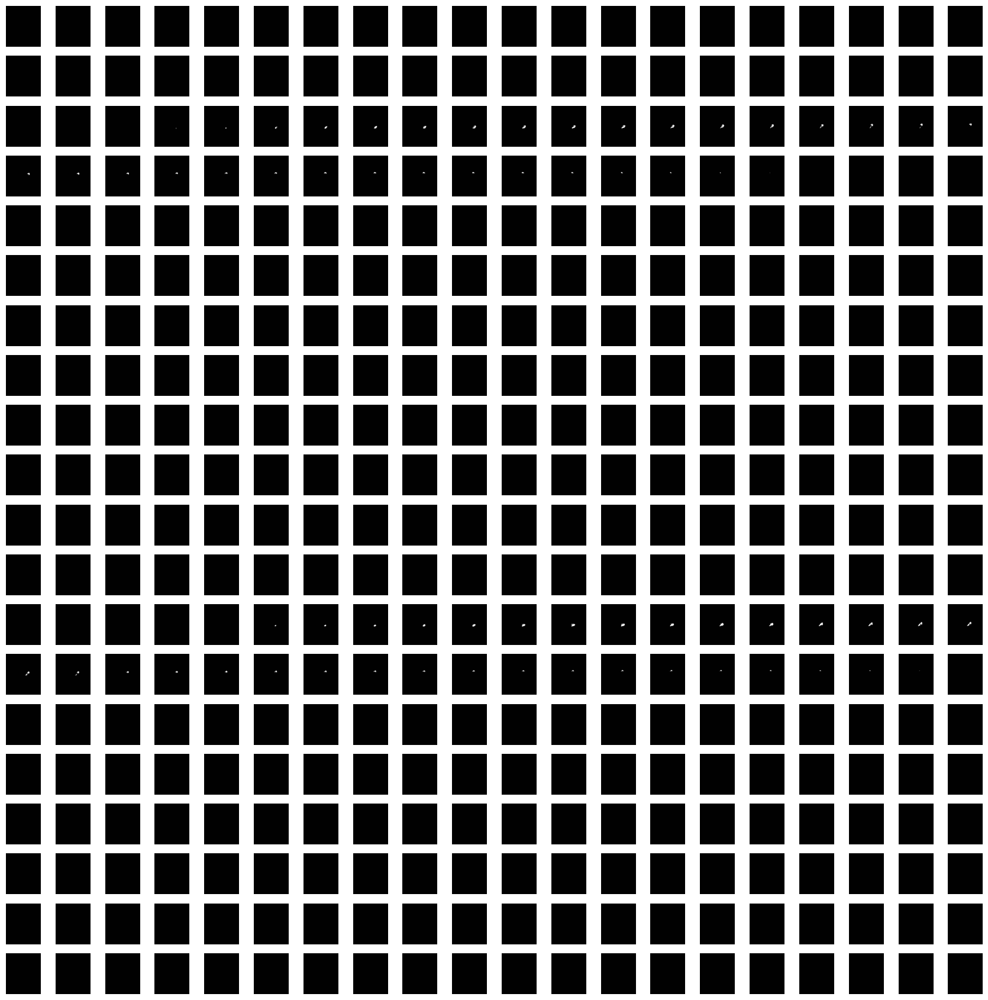

In [31]:
plt.style.use("default")
figure,axis = plt.subplots(20,20,figsize=(17,17))

for indexing,operations in enumerate(axis.flat):
    
    Example_IMG = cv2.cvtColor(cv2.imread(Sorted_R[indexing]),cv2.COLOR_BGR2RGB)
    
    operations.imshow(Example_IMG)
    operations.axis("off")

plt.tight_layout()
plt.show

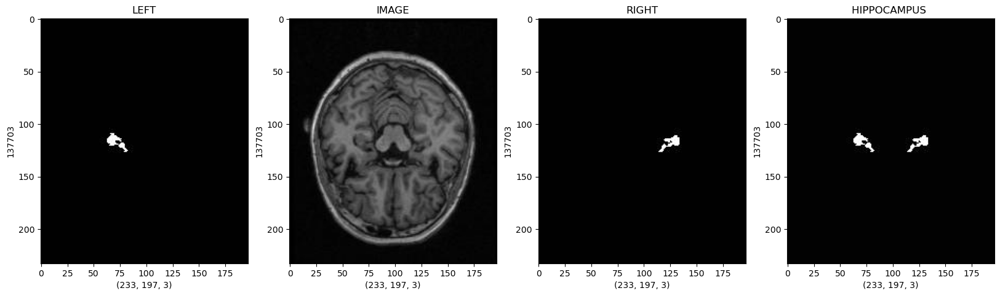

In [32]:

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1000]), cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1000]), cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1000]), cv2.COLOR_BGR2RGB)

Hıppocampus = cv2.addWeighted(Example_L, 1, Example_R, 1, 0.2)


figure, axis = plt.subplots(1, 4, figsize=(20, 20))

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Hıppocampus.shape)
axis[3].set_ylabel(Hıppocampus.size)
axis[3].set_title("HIPPOCAMPUS ")
axis[3].imshow(Hıppocampus)

plt.show()

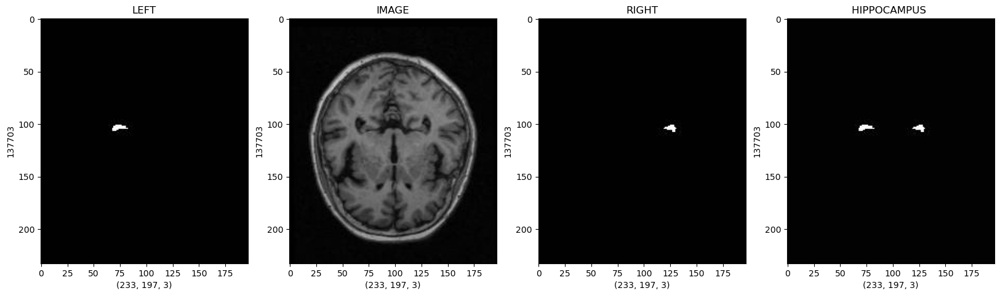

In [33]:
Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1010]), cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1010]), cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1010]), cv2.COLOR_BGR2RGB)

Hıppocampus = cv2.addWeighted(Example_L, 1, Example_R, 1, 0.2)


figure, axis = plt.subplots(1, 4, figsize=(20, 20))

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Hıppocampus.shape)
axis[3].set_ylabel(Hıppocampus.size)
axis[3].set_title("HIPPOCAMPUS ")
axis[3].imshow(Hıppocampus)

plt.show()

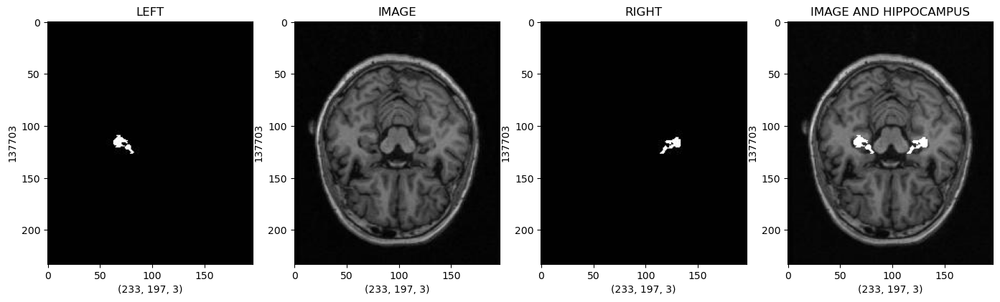

In [34]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG,1,Hıppocampus,1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)


axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)


axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMAGE AND HIPPOCAMPUS")
axis[3].imshow(Main_Concat)


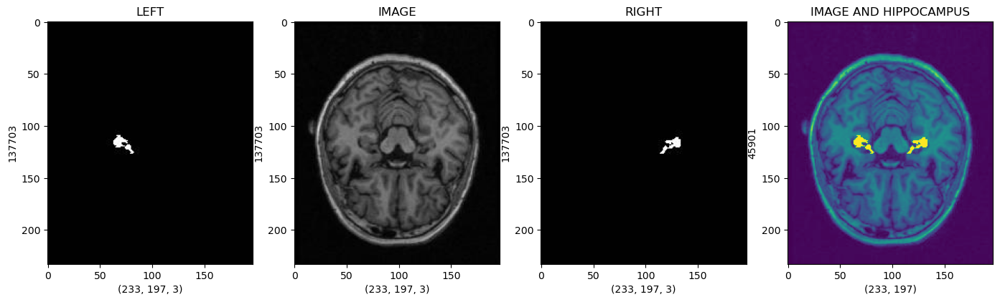

In [35]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG[:,:,0],1,Hıppocampus[:,:,0],1,0.2)
axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMAGE AND HIPPOCAMPUS")
axis[3].imshow(Main_Concat)


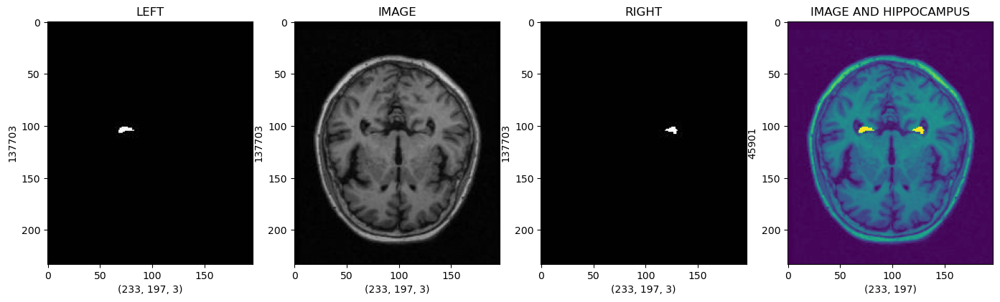

In [36]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Main_Concat = cv2.addWeighted(Example_IMG[:,:,0],1,Hıppocampus[:,:,0],1,0.2)
axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)
axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat.shape)
axis[3].set_ylabel(Main_Concat.size)
axis[3].set_title("IMAGE AND HIPPOCAMPUS")
axis[3].imshow(Main_Concat)


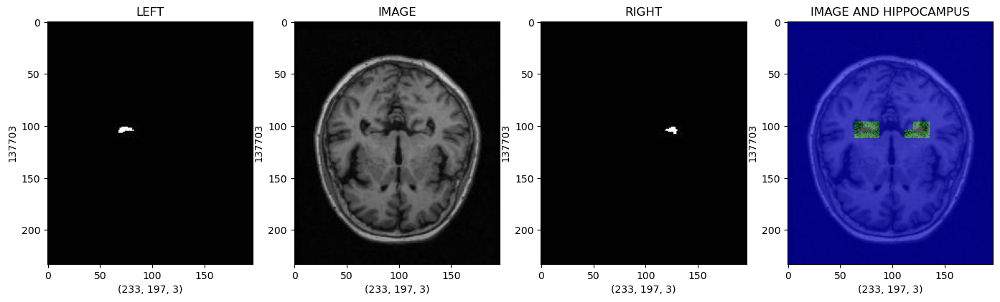

In [37]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus[:,:,0] == 1] = [0,255,0]
Copy_Main[Hıppocampus[:,:,0] == 2] = [0,0,255]
    
Copy_Main_Two = Example_IMG.copy()
Main_Concat = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat .shape)
axis[3].set_ylabel(Main_Concat .size)
axis[3].set_title("IMAGE AND HIPPOCAMPUS")
axis[3].imshow(Main_Concat)

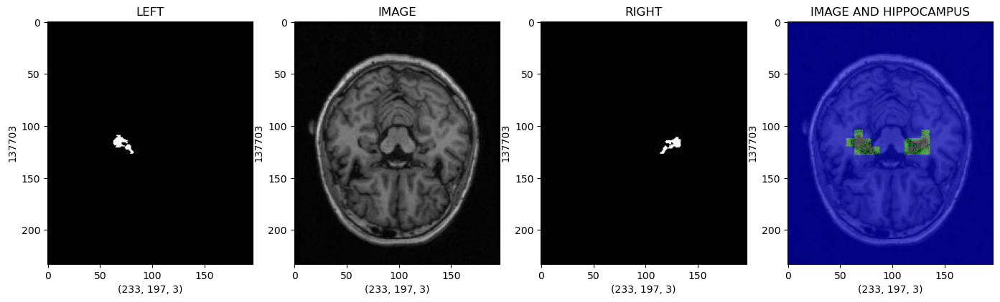

In [38]:
figure,axis = plt.subplots(1,4,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)

Copy_Main = Example_IMG.copy()
Copy_Main[Hıppocampus[:,:,0] == 1] = [0,255,0]
Copy_Main[Hıppocampus[:,:,0] == 2] = [0,0,255]
    
Copy_Main_Two = Example_IMG.copy()
Main_Concat = cv2.addWeighted(Copy_Main,0.5,Copy_Main_Two,0.5,0,Copy_Main_Two)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Main_Concat .shape)
axis[3].set_ylabel(Main_Concat .size)
axis[3].set_title("IMAGE AND HIPPOCAMPUS")
axis[3].imshow(Main_Concat)

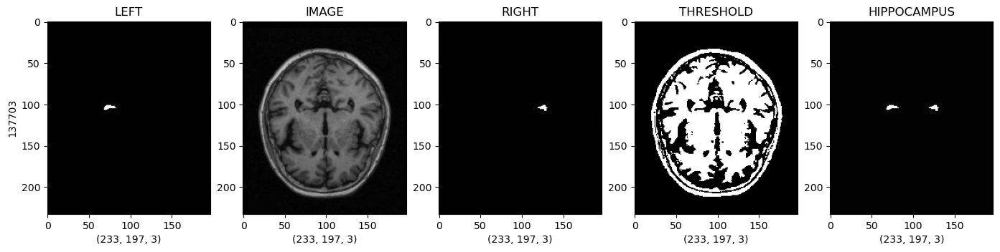

In [39]:
figure,axis = plt.subplots(1,5,figsize=(17,17))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)
axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Hıppocampus.shape)
axis[4].set_ylabel(Hıppocampus.size)
axis[4].set_title("HIPPOCAMPUS")
axis[4].imshow(Hıppocampus)

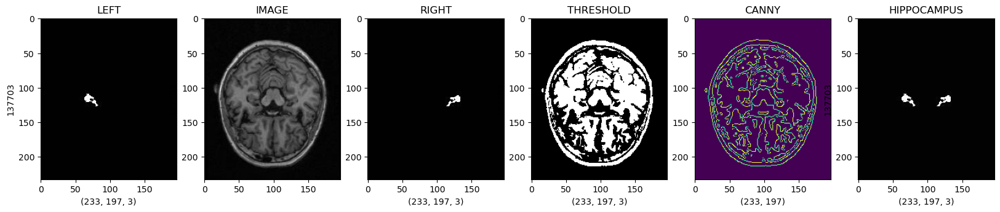

In [40]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Hıppocampus.shape)
axis[5].set_ylabel(Hıppocampus.size)
axis[5].set_title("HIPPOCAMPUS")
axis[5].imshow(Hıppocampus)

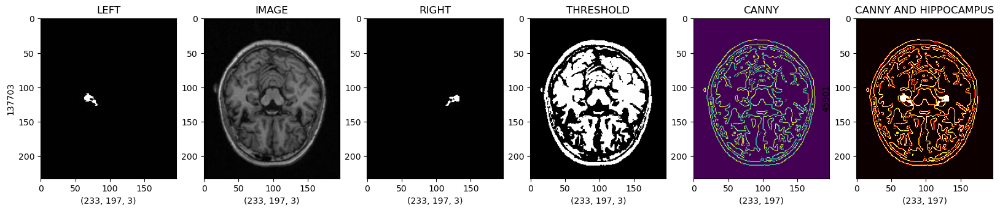

In [41]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1000]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1000]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1000]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus= cv2.addWeighted(Canny_IMG,1,Hıppocampus[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)


axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus.shape)
axis[5].set_ylabel(Canny_Hıppocampus.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS")
axis[5].imshow(Canny_Hıppocampus, cmap = 'hot')

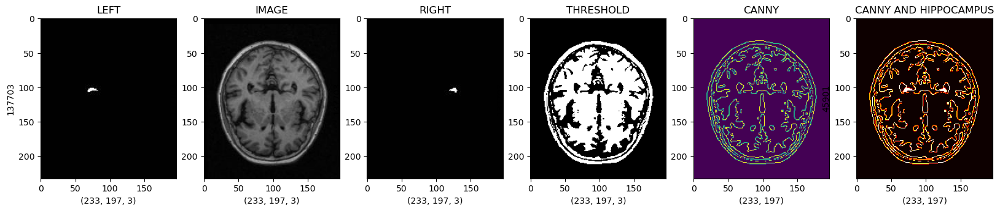

In [43]:
figure,axis = plt.subplots(1,6,figsize=(20,20))

Example_L = cv2.cvtColor(cv2.imread(Sorted_L[1010]),cv2.COLOR_BGR2RGB)
Example_R = cv2.cvtColor(cv2.imread(Sorted_R[1010]),cv2.COLOR_BGR2RGB)
Example_IMG = cv2.cvtColor(cv2.imread(Sorted_IMG[1010]),cv2.COLOR_BGR2RGB)
Hıppocampus = cv2.addWeighted(Example_L,1,Example_R,1,0.2)
_,Threshold_IMG = cv2.threshold(Example_IMG,70,255,cv2.THRESH_BINARY)
Canny_IMG = cv2.Canny(Threshold_IMG,10,100)
Canny_Hıppocampus= cv2.addWeighted(Canny_IMG,1,Hıppocampus[:,:,0],1,0.2)

axis[0].set_xlabel(Example_L.shape)
axis[0].set_ylabel(Example_L.size)
axis[0].set_title("LEFT")
axis[0].imshow(Example_L)

axis[1].set_xlabel(Example_IMG.shape)
axis[1].set_ylabel(Example_IMG.size)
axis[1].set_title("IMAGE")
axis[1].imshow(Example_IMG)

axis[2].set_xlabel(Example_R.shape)
axis[2].set_ylabel(Example_R.size)
axis[2].set_title("RIGHT")
axis[2].imshow(Example_R)

axis[3].set_xlabel(Threshold_IMG.shape)
axis[3].set_ylabel(Threshold_IMG.size)
axis[3].set_title("THRESHOLD")
axis[3].imshow(Threshold_IMG)

axis[4].set_xlabel(Canny_IMG.shape)
axis[4].set_ylabel(Canny_IMG.size)
axis[4].set_title("CANNY")
axis[4].imshow(Canny_IMG)

axis[5].set_xlabel(Canny_Hıppocampus.shape)
axis[5].set_ylabel(Canny_Hıppocampus.size)
axis[5].set_title("CANNY AND HIPPOCAMPUS")
axis[5].imshow(Canny_Hıppocampus,cmap="hot")

In [13]:
data = pd.DataFrame({"Left":Sorted_L[:1500],"Right":Sorted_R[:1500], "Image":Sorted_IMG[:1500]})
data

,Left,Right,Image
0,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
1,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
2,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
3,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
4,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
...,...,...,...
1495,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
1496,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
1497,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...
1498,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...,C:\Users\swarnadeep acharya\Downloads\ADNI hip...


## Removing all blank images

In [14]:

remove_indices = []
for i in range(len(data)):
    row = data.iloc[i]
    Example_L = cv2.cvtColor(cv2.imread(row["Left"]), cv2.COLOR_BGR2RGB)
    Example_R = cv2.cvtColor(cv2.imread(row["Right"]), cv2.COLOR_BGR2RGB)
    Hıppocampus_Concat = cv2.addWeighted(Example_L, 1, Example_R, 1, 0.2)

    maxColorVoxel = np.max(Hıppocampus_Concat)
    minColorVoxel = np.min(Hıppocampus_Concat)

    if maxColorVoxel == minColorVoxel:
        remove_indices.append(i)

print(len(remove_indices))

1262


In [15]:
data = data.drop(remove_indices).reset_index(drop=True)

# Pre-processing the images

In [16]:
IMAGE_SIZE = (256, 256)

def preprocess_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)  
    img = tf.cast(img, tf.float32)
    img = tf.image.resize_with_pad(img, IMAGE_SIZE[0], IMAGE_SIZE[1])
    img = img / 255.0
    
    return img

def preprocess_mask(mask_path):
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_jpeg(mask, channels=3)  
    mask = np.array(mask)
    grayscale_mask = np.mean(mask, axis=-1, keepdims=True)
    mask = tf.convert_to_tensor(grayscale_mask, dtype=tf.float32)
    mask = tf.image.resize_with_pad(mask, IMAGE_SIZE[0], IMAGE_SIZE[1])
    mask /= 255.0
    
    return mask

left_hippo_masks = data["Left"]
right_hippo_masks = data["Right"]
mri_image_paths = data["Image"]

preprocessed_left_masks = []
for mask_path in left_hippo_masks:
    preprocessed_mask = preprocess_mask(mask_path)
    preprocessed_left_masks.append(preprocessed_mask)


preprocessed_right_masks = []
for mask_path in right_hippo_masks:
    preprocessed_mask = preprocess_mask(mask_path)
    preprocessed_right_masks.append(preprocessed_mask)

images = []
for image_path in mri_image_paths:
    preprocessed_image = preprocess_image(image_path)
    images.append(preprocessed_image)
    

preprocessed_left_masks = np.array(preprocessed_left_masks)
preprocessed_right_masks = np.array(preprocessed_right_masks)
images = np.array(images)

print("Shape of preprocessed left masks:", preprocessed_left_masks.shape)
print("Shape of preprocessed right masks:", preprocessed_right_masks.shape)
print("Shape of preprocessed MRI images:", images.shape)


Shape of preprocessed left masks: (238, 256, 256, 1)
Shape of preprocessed right masks: (238, 256, 256, 1)
Shape of preprocessed MRI images: (238, 256, 256, 3)


In [17]:

masks = preprocessed_left_masks + preprocessed_right_masks
print("Shape of combined masks:", masks.shape)

Shape of combined masks: (238, 256, 256, 1)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


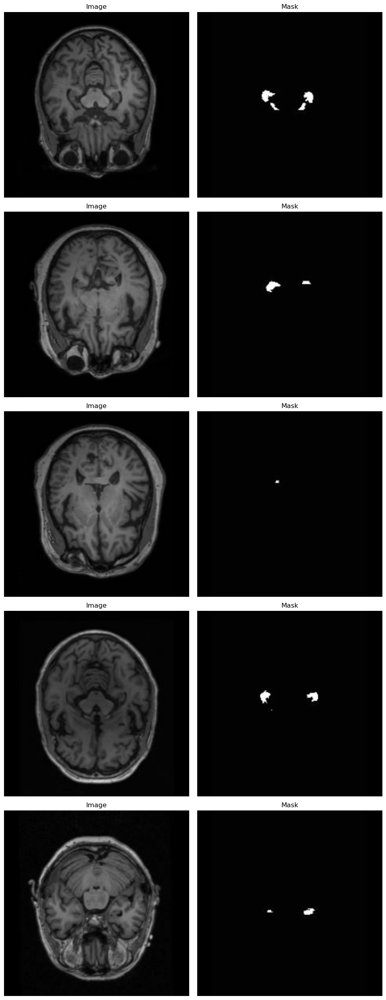

In [21]:

def visualize_samples(X, Y, num_samples=5):
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))
    for i in range(num_samples):
        idx = random.randint(0, len(X) - 1)
        axes[i, 0].imshow(X[idx])
        axes[i, 0].set_title('Image')
        axes[i, 0].axis('off')
        axes[i, 1].imshow(np.squeeze(Y[idx]), cmap='gray')
        axes[i, 1].set_title('Mask')
        axes[i, 1].axis('off')
    plt.tight_layout()
    plt.show()

visualize_samples(images, masks)

# Data split into train and validation

In [18]:
X_train, X_val, y_train, y_val = train_test_split(images, masks,test_size=0.2, random_state=42)

In [19]:
print(f"Training images shape: {X_train.shape}")
print(f"Training masks shape: {y_train.shape}")
print(f"Validation images shape: {X_val.shape}")
print(f"Validation masks shape: {y_val.shape}")

Training images shape: (190, 256, 256, 3)
Training masks shape: (190, 256, 256, 1)
Validation images shape: (48, 256, 256, 3)
Validation masks shape: (48, 256, 256, 1)


# Augmenting the images

In [20]:

augmentation_train = A.Compose([
    A.Resize(256,224),
    A.Rotate(limit=20, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.5),
    A.Sharpen(p=0.5)
])

augmentation_val = A.Compose([
    A.Resize(256,224)
])

def train_aug(image, mask):
    
    data = {'image': image, 'mask': mask}
    augmented = augmentation_train(**data)
    augmented_train_image = augmented['image']
    augmented_train_mask = augmented['mask']
    
    return augmented_train_image, augmented_train_mask

def validation_aug(image, mask):

    data = {'image': image, 'mask': mask}
    augmented = augmentation_val(**data)
    augmented_val_image = augmented['image']
    augmented_val_mask = augmented['mask']
    return augmented_val_image, augmented_val_mask

augmented_train_images = []
augmented_train_masks = []
augmented_val_images = []
augmented_val_masks = []

for i in range(len(X_train)):
    augmented_train_image, augmented_train_mask = train_aug(X_train[i], y_train[i])
    augmented_train_images.append(augmented_train_image)
    augmented_train_masks.append(augmented_train_mask)
    
for i in range(len(X_val)):
    augmented_val_image, augmented_val_mask = validation_aug(X_val[i], y_val[i])
    augmented_val_images.append(augmented_val_image)
    augmented_val_masks.append(augmented_val_mask)

X_train = np.array(augmented_train_images)
y_train = np.array(augmented_train_masks)
X_val = np.array(augmented_val_images)
y_val =  np.array(augmented_val_masks)

print("Shape of augmented train images:", X_train.shape)
print("Shape of augmented train masks:", y_train.shape)
print("Shape of augmented validation images:", X_val.shape)
print("Shape of augmented validation masks:", y_val.shape)


Shape of augmented train images: (190, 256, 224, 3)
Shape of augmented train masks: (190, 256, 224, 1)
Shape of augmented validation images: (48, 256, 224, 3)
Shape of augmented validation masks: (48, 256, 224, 1)


TRAINING IMAGES : 


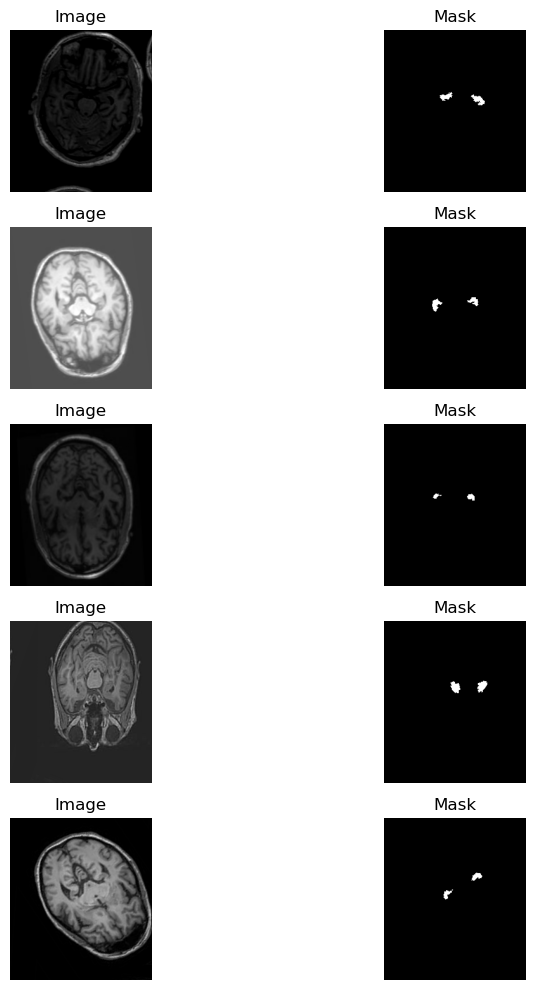

VALIDATION IMAGES : 


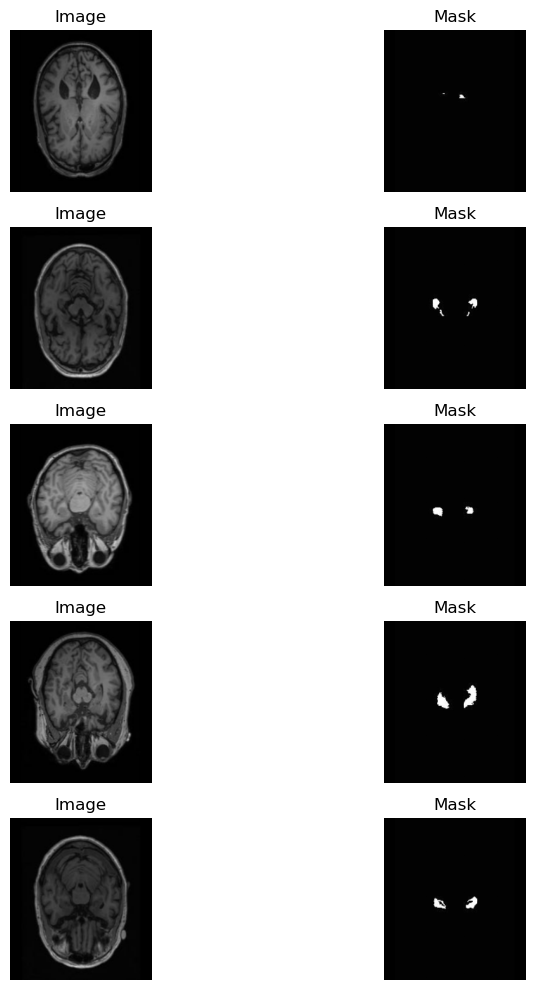

In [36]:
def plot_images(images, masks=None, num_images=5):
    fig, axes = plt.subplots(num_images, 2, figsize=(10, 10))
    for i in range(num_images):
        axes[i, 0].imshow(images[i], cmap='gray')
        axes[i, 0].axis('off')
        axes[i, 0].set_title('Image')

        if masks is not None:
            axes[i, 1].imshow(masks[i], cmap='gray')
            axes[i, 1].axis('off')
            axes[i, 1].set_title('Mask')

    plt.tight_layout()
    plt.show()

print("TRAINING IMAGES : ")
plot_images(X_train, y_train)
print("VALIDATION IMAGES : ")
plot_images(X_val, y_val)


## Defining loss functions and other metrics

In [21]:

smooth =100
def iou(y_true, y_pred):
    intersection = K.sum(y_true * y_pred)
    sum_ = K.sum(y_true + y_pred)
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return jac
    
def dice_coef(y_true, y_pred):
    y_truef=K.flatten(y_true)
    y_predf=K.flatten(y_pred)
    And=K.sum(y_truef* y_predf)
    return((2* And + smooth) / (K.sum(y_truef) + K.sum(y_predf) + smooth))

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

# U-net model building

In [22]:

def Conv2dBlock(inputTensor, numFilters, kernelSize = 3, doBatchNorm = True):
    #First Convolution layer
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (inputTensor)
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
    x =tf.keras.layers.Activation('relu')(x)
    #Second Convolution layer
    x = tf.keras.layers.Conv2D(filters = numFilters, kernel_size = (kernelSize, kernelSize),
                              kernel_initializer = 'he_normal', padding = 'same') (x)
    if doBatchNorm:
        x = tf.keras.layers.BatchNormalization()(x)
    x = tf.keras.layers.Activation('relu')(x)
    return x
def GiveMeUnet(inputImage, numFilters = 16, droupouts = 0.1, doBatchNorm = True):
    #contraction phase
    c1 = Conv2dBlock(inputImage, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)
    p1 = tf.keras.layers.Dropout(droupouts)(p1)
    c2 = Conv2dBlock(p1, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)
    p2 = tf.keras.layers.Dropout(droupouts)(p2)
    c3 = Conv2dBlock(p2, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)
    p3 = tf.keras.layers.Dropout(droupouts)(p3)
    c4 = Conv2dBlock(p3, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)
    p4 = tf.keras.layers.Dropout(droupouts)(p4)
    c5 = Conv2dBlock(p4, numFilters * 16, kernelSize = 3, doBatchNorm = doBatchNorm)
    #expansion phase
    u6 = tf.keras.layers.Conv2DTranspose(numFilters*8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])
    u6 = tf.keras.layers.Dropout(droupouts)(u6)
    c6 = Conv2dBlock(u6, numFilters * 8, kernelSize = 3, doBatchNorm = doBatchNorm)
    u7 = tf.keras.layers.Conv2DTranspose(numFilters*4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])
    u7 = tf.keras.layers.Dropout(droupouts)(u7)
    c7 = Conv2dBlock(u7, numFilters * 4, kernelSize = 3, doBatchNorm = doBatchNorm)
    u8 = tf.keras.layers.Conv2DTranspose(numFilters*2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])
    u8 = tf.keras.layers.Dropout(droupouts)(u8)
    c8 = Conv2dBlock(u8, numFilters * 2, kernelSize = 3, doBatchNorm = doBatchNorm)
    u9 = tf.keras.layers.Conv2DTranspose(numFilters*1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])
    u9 = tf.keras.layers.Dropout(droupouts)(u9)
    c9 = Conv2dBlock(u9, numFilters * 1, kernelSize = 3, doBatchNorm = doBatchNorm)
    output = tf.keras.layers.Conv2D(1, (1, 1), activation = 'sigmoid')(c9)
    model = tf.keras.Model(inputs = [inputImage], outputs = [output])
    return model

In [23]:
inputImage = tf.keras.layers.Input(shape=(256, 224, 3))
unet = GiveMeUnet(inputImage=inputImage)
unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 224, 16)         448       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 256, 224, 16)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 256, 224, 16)         0         ['batch_normalization[0][0

In [24]:
unet.compile(optimizer = Adam(learning_rate = 0.001), loss =dice_coef_loss, metrics = [dice_coef,iou])

In [25]:
path  = r'C:\Users\swarnadeep acharya\Downloads\My data files\saved_models\hippo-weights-{epoch:04d}.h5'
callbacks = [ ModelCheckpoint(filepath = path , monitor='val_iou', save_weights_only=True, save_best_only=True, mode= 'max',verbose =1),
             ReduceLROnPlateau(monitor='val_iou', factor=0.2, patience=5, min_lr=0.001, mode = 'max'),
             EarlyStopping(patience=15, monitor='val_iou',restore_best_weights = True, mode = 'max',verbose=1)]

steps_per_epoch = len(X_train) // 32
validation_steps = len(X_val) // 32

In [83]:
history = unet.fit(X_train,y_train, epochs= 100 ,batch_size = 8 , validation_data = (X_val,y_val),steps_per_epoch= steps_per_epoch, validation_steps = validation_steps, callbacks=callbacks)

Epoch 1/100
23/23 [==============================] - ETA: 0s - loss: 0.2413 - dice_coef: 0.7587 - iou: 0.6251
Epoch 1: val_iou did not improve from 0.26199
23/23 [==============================] - 20s 850ms/step - loss: 0.2413 - dice_coef: 0.7587 - iou: 0.6251 - val_loss: 0.6010 - val_dice_coef: 0.3990 - val_iou: 0.2590 - lr: 0.0010
Epoch 2/100
23/23 [==============================] - ETA: 0s - loss: 0.2303 - dice_coef: 0.7691 - iou: 0.6366
Epoch 2: val_iou did not improve from 0.26199
23/23 [==============================] - 20s 866ms/step - loss: 0.2303 - dice_coef: 0.7691 - iou: 0.6366 - val_loss: 0.6458 - val_dice_coef: 0.3542 - val_iou: 0.2249 - lr: 0.0010
Epoch 3/100
23/23 [==============================] - ETA: 0s - loss: 0.2415 - dice_coef: 0.7544 - iou: 0.6235
Epoch 3: val_iou did not improve from 0.26199
23/23 [==============================] - 19s 815ms/step - loss: 0.2415 - dice_coef: 0.7544 - iou: 0.6235 - val_loss: 0.6346 - val_dice_coef: 0.3654 - val_iou: 0.2351 - lr: 0.

In [91]:
unet.save("unet_segment_model.h5")

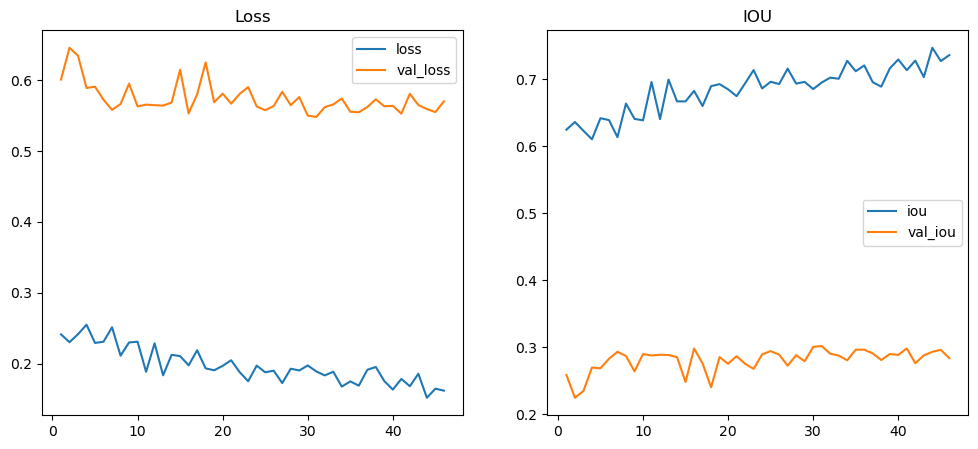

In [112]:
loss = history.history['loss']
val_loss = history.history['val_loss']
iou = history.history['iou']
val_iou = history.history['val_iou']

epoch = np.arange(1, len(loss)+1)

plt.figure(figsize=(25,5))

plt.subplot(141)
plt.plot(epoch, loss, label='loss')
plt.plot(epoch, val_loss, label='val_loss')
plt.legend()
plt.title('Loss')

plt.subplot(142)
plt.plot(epoch, iou, label='iou')
plt.plot(epoch, val_iou, label='val_iou')
plt.legend()
plt.title('IOU')

plt.show()

In [26]:
unet_model = load_model('unet_segment_model.h5', custom_objects={'dice_coef_loss':dice_coef_loss, 'iou':iou, 'dice_coef':dice_coef})
print("Model loaded")

Model loaded


In [27]:
best_weights_path = r'C:\Users\swarnadeep acharya\Downloads\My data files\saved_models\hippo-weights-0031.h5'
unet_model.load_weights(best_weights_path)
print("weights loaded")

weights loaded


In [43]:
val_predictions = unet_model.predict(X_val)

2/2 [==============================] - 2s 421ms/step


In [158]:
y_pred = val_predictions
val_loss = dice_coef_loss(y_val, y_pred)
val_dice_coef = dice_coef(y_val, y_pred)
val_iou = iou(y_val, y_pred)


print(f"Test Loss: {val_loss}")
print(f"Test Dice Coefficient: {val_dice_coef}")
print(f"Test IoU: {val_iou}")

Test Loss: 0.5381723642349243
Test Dice Coefficient: 0.46182766556739807
Test IoU: 0.30130288004875183


# U-net model predictions

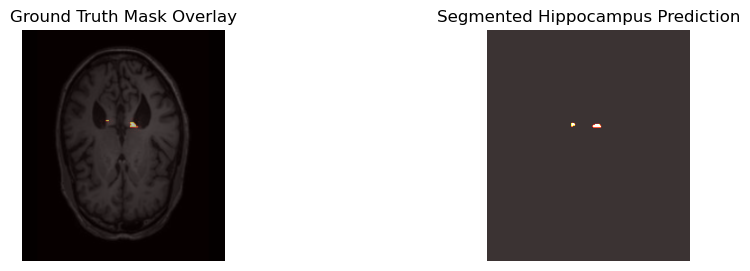

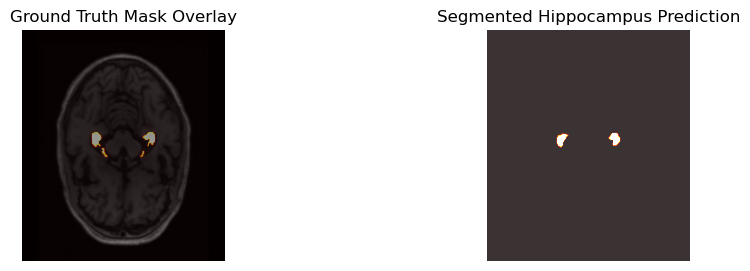

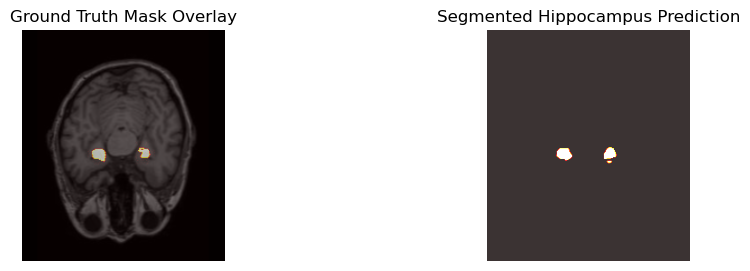

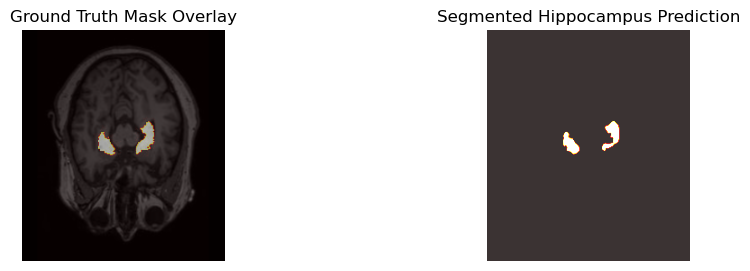

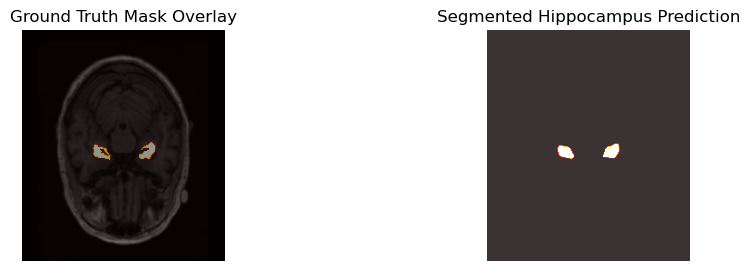

In [83]:

num_examples = 5

for i in range(num_examples):
     plt.figure(figsize=(11, 3))

     plt.subplot(1,2,1)
     plt.imshow(X_val[i].squeeze(), cmap='gray')
     plt.imshow(y_val[i].squeeze(), cmap='hot', alpha=0.5)  
     plt.title('Ground Truth Mask Overlay')
     plt.axis("off")
    
     plt.subplot(1, 2, 2)
     plt.imshow(val_predictions[i].squeeze(), cmap='hot', alpha=0.8) 
     plt.title('Segmented Hippocampus Prediction')
     plt.axis("off")

plt.show()


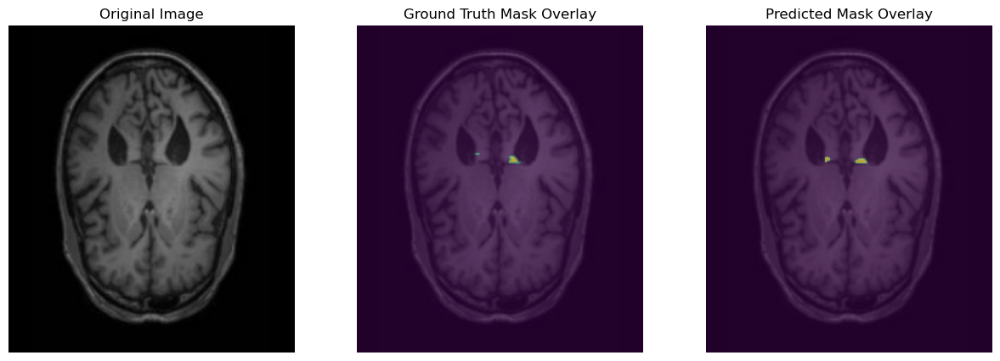

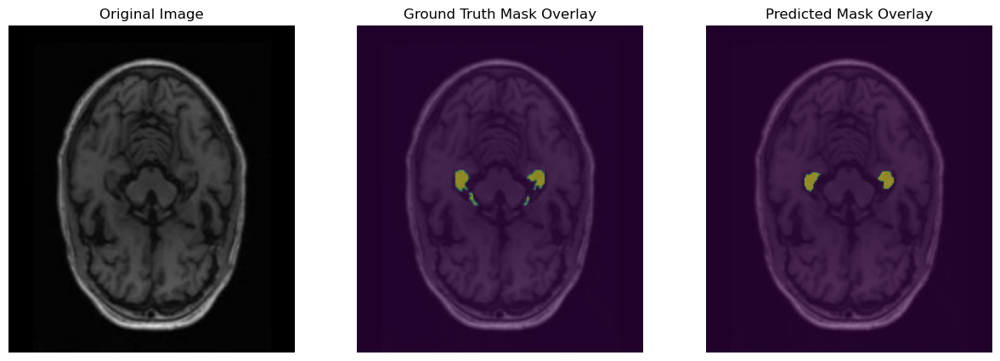

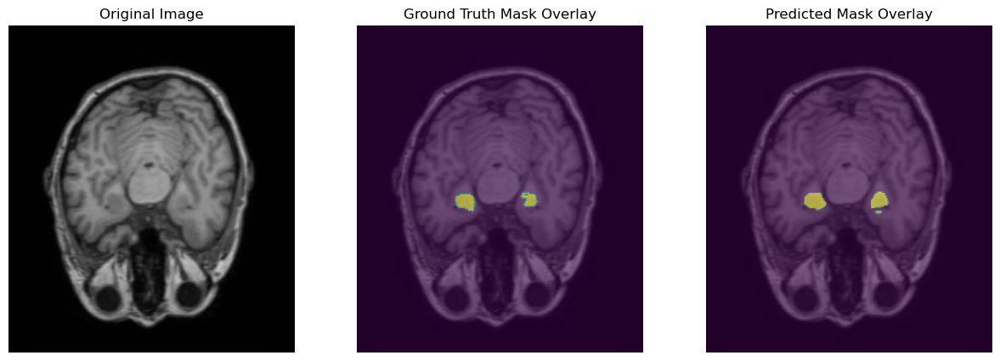

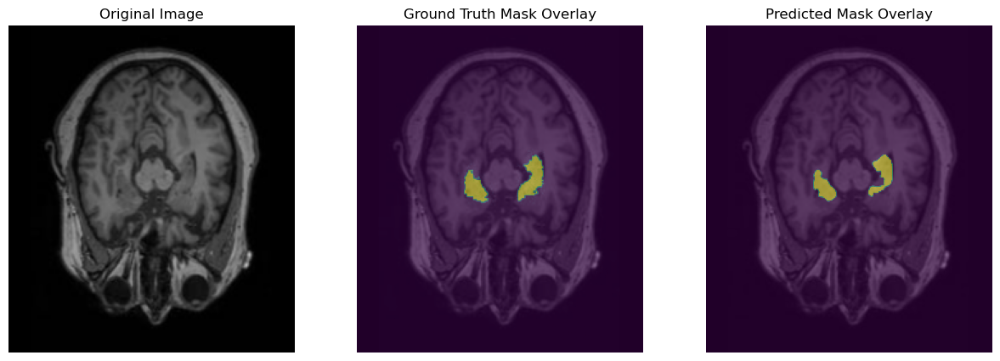

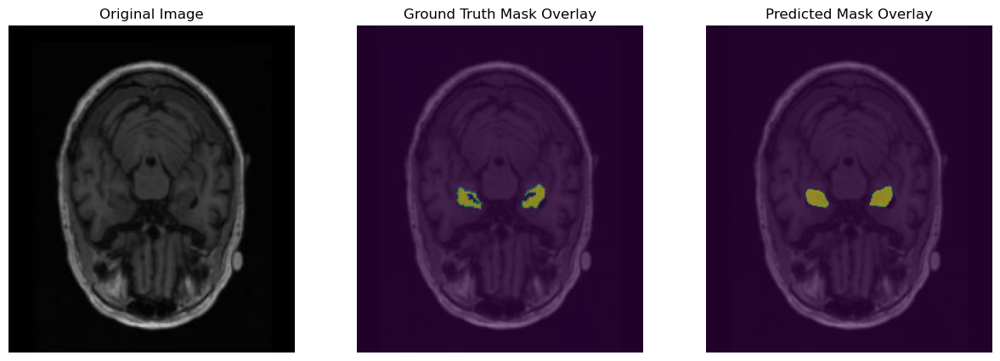

In [84]:

num_examples = 5

for i in range(num_examples):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.title('Original Image')
    plt.axis("off")
    
    if y_val is not None:
        plt.subplot(1, 3, 2)
        plt.imshow(X_val[i].squeeze(), cmap='gray')
        plt.imshow(y_val[i].squeeze(), cmap='viridis', alpha=0.5)  
        plt.title('Ground Truth Mask Overlay')
        plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.imshow(val_predictions[i].squeeze(), cmap='viridis', alpha=0.5) 
    plt.title('Predicted Mask Overlay')
    plt.axis("off")

plt.show()

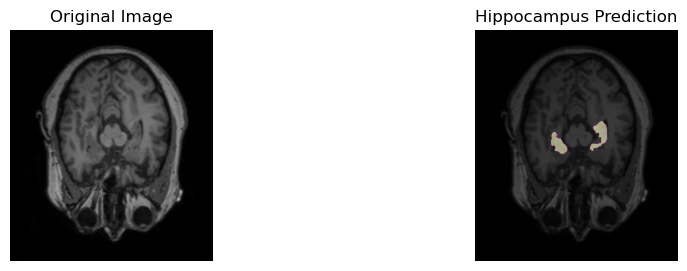

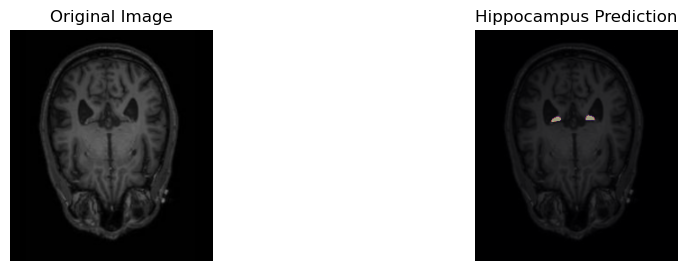

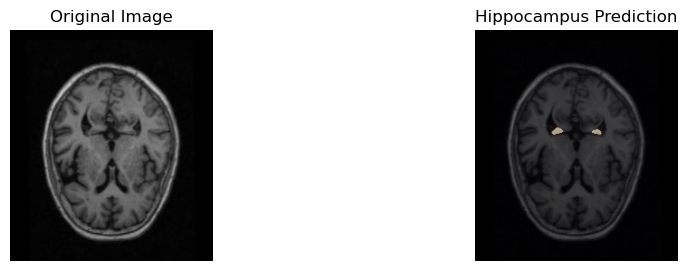

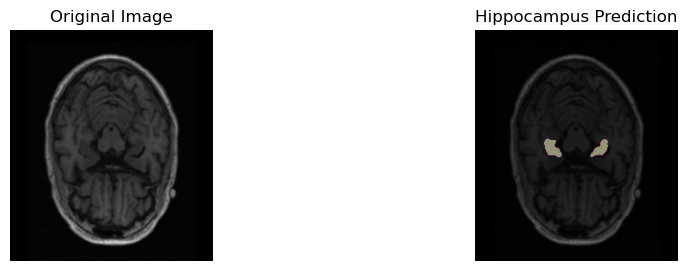

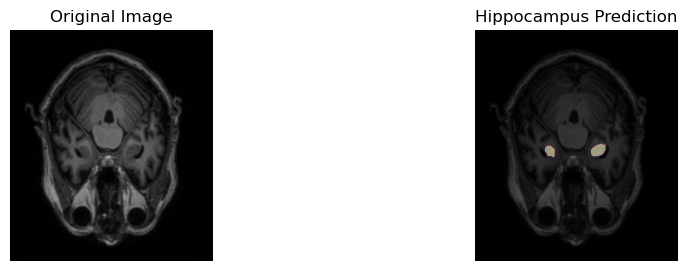

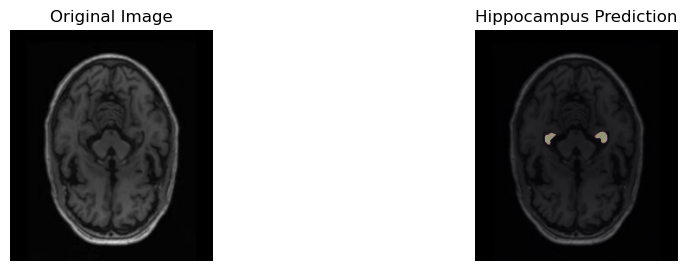

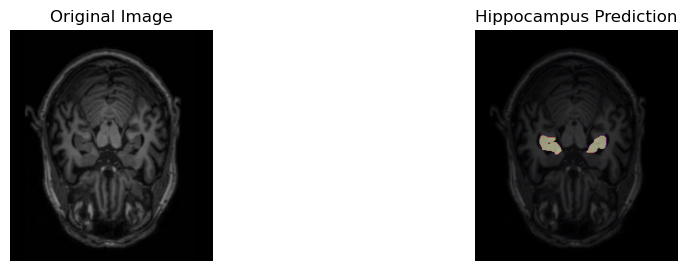

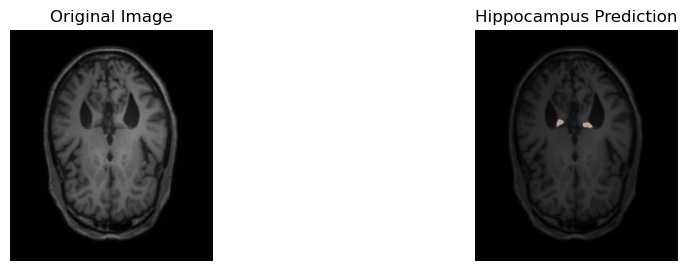

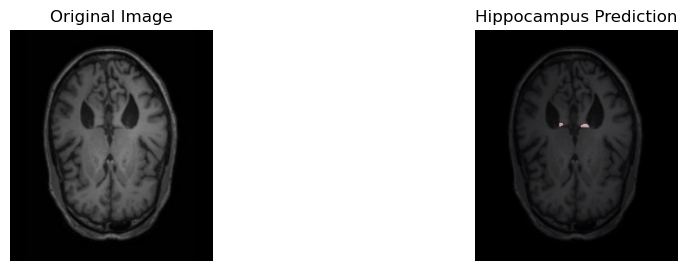

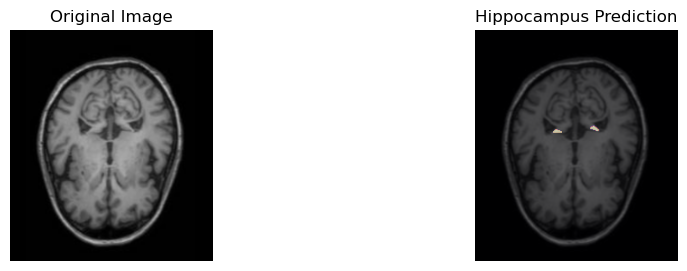

In [60]:
# Randomly selecting 10 images 
num_examples = 10 
indices = np.random.choice(len(X_val), num_examples, replace=False)  

for i in indices:
    plt.figure(figsize=(11, 3))

    plt.subplot(1, 2, 1)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.title('Original Image')
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.imshow(val_predictions[i].squeeze(), cmap='magma', alpha=0.5) 
    plt.title('Hippocampus Prediction')
    plt.axis("off")

plt.show()


# V-Net model building

In [33]:

def conv_block(input_tensor, num_filters, kernel_size=3, padding='same', use_batch_norm=True, dropout_rate=0.2):
    x = Conv2D(num_filters, kernel_size, padding=padding, kernel_initializer='he_normal')(input_tensor)
    if use_batch_norm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    if dropout_rate:
        x = Dropout(dropout_rate)(x)
    return x

def residual_block(input_tensor, num_filters, kernel_size=3, padding='same', use_batch_norm=True, dropout_rate=0.2):
    x = conv_block(input_tensor, num_filters, kernel_size, padding, use_batch_norm, dropout_rate)
    x = conv_block(x, num_filters, kernel_size, padding, use_batch_norm, dropout_rate)
    x = Add()([input_tensor, x])
    return x

def VNet(input_shape=(256, 224, 3), num_classes=1):
    inputs = Input(shape=input_shape)

    # Encoder
    x = conv_block(inputs, 16, kernel_size=3, padding='same', dropout_rate=0.3)
    x = residual_block(x, 16)
    skip1 = x

    x = Conv2D(32, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = residual_block(x, 32)
    skip2 = x

    x = Conv2D(64, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = residual_block(x, 64)
    skip3 = x

    x = Conv2D(128, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = residual_block(x, 128)
    skip4 = x

    x = Conv2D(256, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = residual_block(x, 256)

    # Decoder
    x = Conv2DTranspose(128, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = Add()([x, skip4])
    x = residual_block(x, 128)

    x = Conv2DTranspose(64, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = Add()([x, skip3])
    x = residual_block(x, 64)

    x = Conv2DTranspose(32, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = Add()([x, skip2])
    x = residual_block(x, 32)

    x = Conv2DTranspose(16, kernel_size=2, strides=2, padding='same', kernel_initializer='he_normal')(x)
    x = Add()([x, skip1])
    x = residual_block(x, 16)

    # Output layer
    outputs = Conv2D(num_classes, (1, 1), activation='sigmoid', kernel_initializer='he_normal', padding='same')(x)

    model = Model(inputs, outputs)
    return model


vnet_model = VNet(input_shape=(256, 224, 3), num_classes=1)
vnet_model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 256, 224, 3)]        0         []                            
                                                                                                  
 conv2d_86 (Conv2D)          (None, 256, 224, 16)         448       ['input_5[0][0]']             
                                                                                                  
 batch_normalization_74 (Ba  (None, 256, 224, 16)         64        ['conv2d_86[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_74 (Activation)  (None, 256, 224, 16)         0         ['batch_normalization_74

In [34]:
vnet_model.compile(optimizer = Adam(learning_rate = 0.001), loss =dice_coef_loss, metrics = [dice_coef,iou])

In [31]:
path  = r'C:\Users\swarnadeep acharya\Downloads\My data files\saved_models_1\hipp-weights-{epoch:04d}.h5'
callbacks = [ ModelCheckpoint(filepath = path , monitor='val_iou', save_weights_only=True, save_best_only=True, mode= 'max',verbose =1),
             ReduceLROnPlateau(monitor='val_iou', factor=0.2, patience=6, min_lr=0.001, mode = 'max'),
             EarlyStopping(patience=15, monitor='val_iou',restore_best_weights = True, mode = 'max',verbose=1)]
steps_per_epoch = len(X_train) // 32
validation_steps = len(X_val) // 32

In [ ]:
history = vnet_model.fit(X_train,y_train, epochs= 100 ,batch_size = 8 , validation_data = (X_val,y_val),steps_per_epoch= steps_per_epoch, validation_steps = validation_steps, callbacks=callbacks)

In [131]:
history = vnet_model.fit(X_train,y_train, epochs= 100 ,batch_size = 8 , validation_data = (X_val,y_val),steps_per_epoch= steps_per_epoch, validation_steps = validation_steps, callbacks=callbacks)

Epoch 1/100
5/5 [==============================] - ETA: 0s - loss: 0.9751 - dice_coef: 0.0249 - iou: 0.0130
Epoch 1: val_iou improved from -inf to 0.01454, saving model to C:\Users\swarnadeep acharya\Downloads\My data files\saved_models_1\hipp-weights-0001.h5
5/5 [==============================] - 15s 1s/step - loss: 0.9751 - dice_coef: 0.0249 - iou: 0.0130 - val_loss: 0.9716 - val_dice_coef: 0.0284 - val_iou: 0.0145 - lr: 0.0010
Epoch 2/100
5/5 [==============================] - ETA: 0s - loss: 0.9632 - dice_coef: 0.0368 - iou: 0.0193
Epoch 2: val_iou improved from 0.01454 to 0.01628, saving model to C:\Users\swarnadeep acharya\Downloads\My data files\saved_models_1\hipp-weights-0002.h5
5/5 [==============================] - 5s 1s/step - loss: 0.9632 - dice_coef: 0.0368 - iou: 0.0193 - val_loss: 0.9683 - val_dice_coef: 0.0317 - val_iou: 0.0163 - lr: 0.0010
Epoch 3/100
5/5 [==============================] - ETA: 0s - loss: 0.9656 - dice_coef: 0.0344 - iou: 0.0196
Epoch 3: val_iou impro

In [132]:
vnet_model.save("vnet_segment_model.h5")

C:\Users\swarnadeep acharya\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


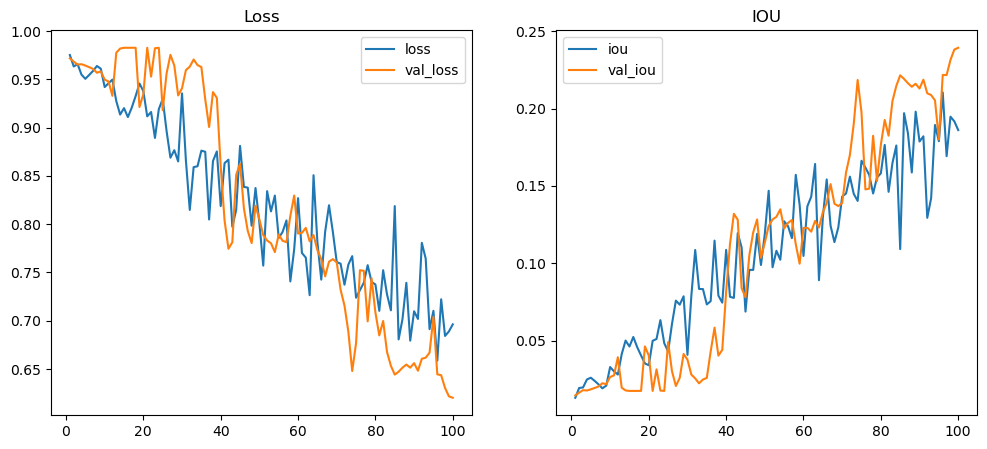

In [133]:
loss = history.history['loss']
val_loss = history.history['val_loss']
iou = history.history['iou']
val_iou = history.history['val_iou']

epoch = np.arange(1, len(loss)+1)

plt.figure(figsize=(25,5))

plt.subplot(141)
plt.plot(epoch, loss, label='loss')
plt.plot(epoch, val_loss, label='val_loss')
plt.legend()
plt.title('Loss')

plt.subplot(142)
plt.plot(epoch, iou, label='iou')
plt.plot(epoch, val_iou, label='val_iou')
plt.legend()
plt.title('IOU')

plt.show()

In [135]:
vnet_model = load_model('vnet_segment_model.h5', custom_objects={'dice_coef_loss':dice_coef_loss, 'iou':iou, 'dice_coef':dice_coef})
print("Model loaded")

Model loaded


In [150]:
best_weights_path = r'C:\Users\swarnadeep acharya\Downloads\My data files\saved_models_1\hipp-weights-0100.h5'
vnet_model.load_weights(best_weights_path)
print("weights loaded")

weights loaded


In [140]:
vnet_val_predictions = vnet_model.predict(X_val)

2/2 [==============================] - 3s 619ms/step


In [159]:
y_pred = vnet_val_predictions
val_loss = dice_coef_loss(y_val, y_pred)
val_dice_coef = dice_coef(y_val, y_pred)
val_iou = iou(y_val, y_pred)


print(f"Test Loss: {val_loss}")
print(f"Test Dice Coefficient: {val_dice_coef}")
print(f"Test IoU: {val_iou}")

Test Loss: 0.6941134333610535
Test Dice Coefficient: 0.30588656663894653
Test IoU: 0.1816316843032837


# V-net model predictions

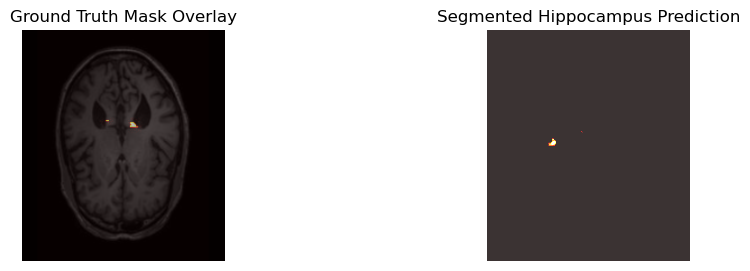

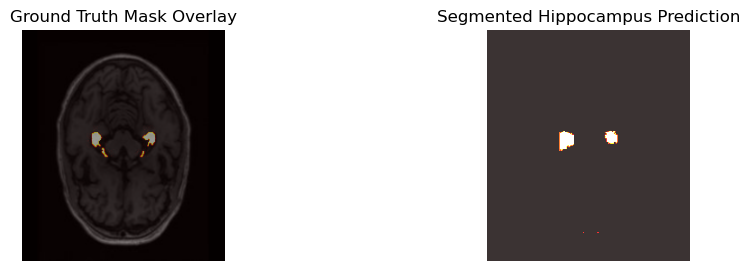

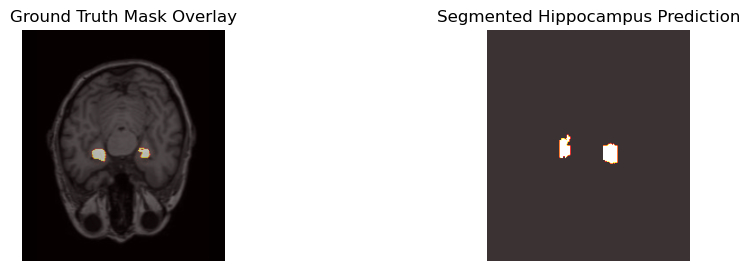

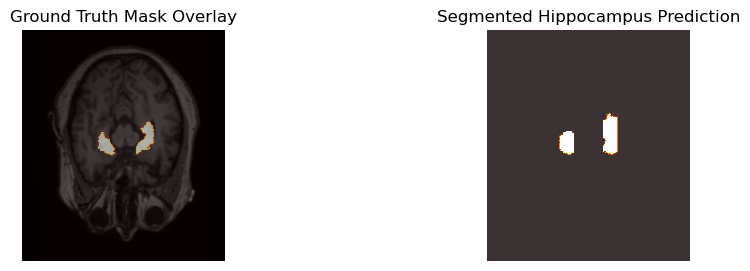

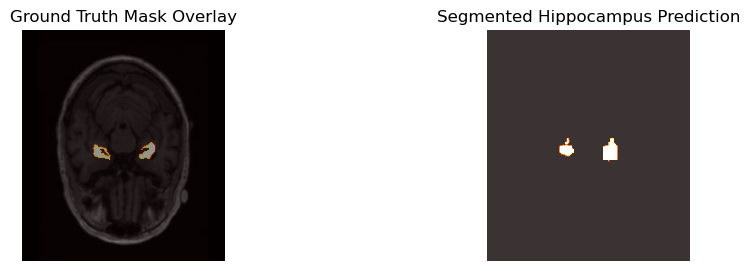

In [142]:
num_examples = 5

for i in range(num_examples):
     plt.figure(figsize=(11, 3))

     plt.subplot(1,2,1)
     plt.imshow(X_val[i].squeeze(), cmap='gray')
     plt.imshow(y_val[i].squeeze(), cmap='hot', alpha=0.5)  
     plt.title('Ground Truth Mask Overlay')
     plt.axis("off")
    
     plt.subplot(1, 2, 2)
     plt.imshow(vnet_val_predictions[i].squeeze(), cmap='hot', alpha=0.8) 
     plt.title('Segmented Hippocampus Prediction')
     plt.axis("off")

plt.show()


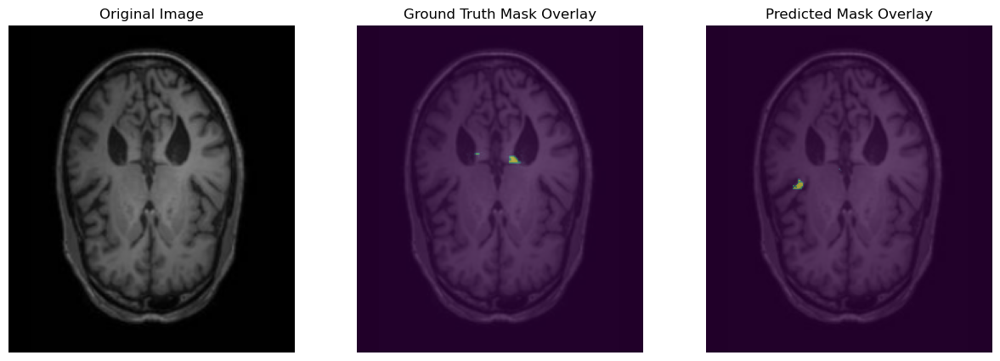

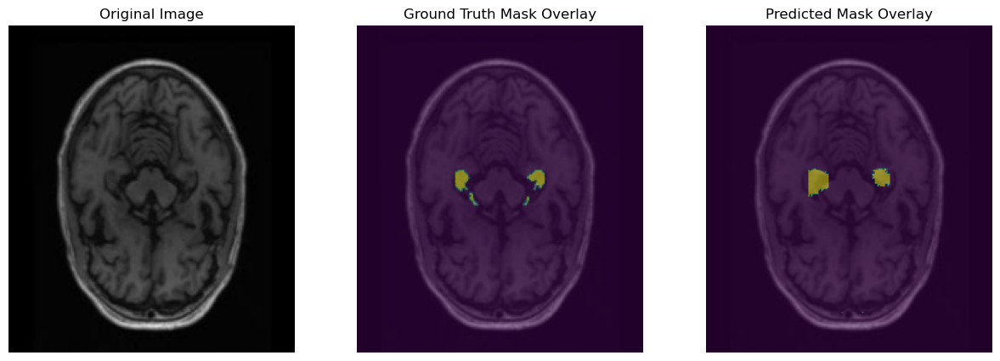

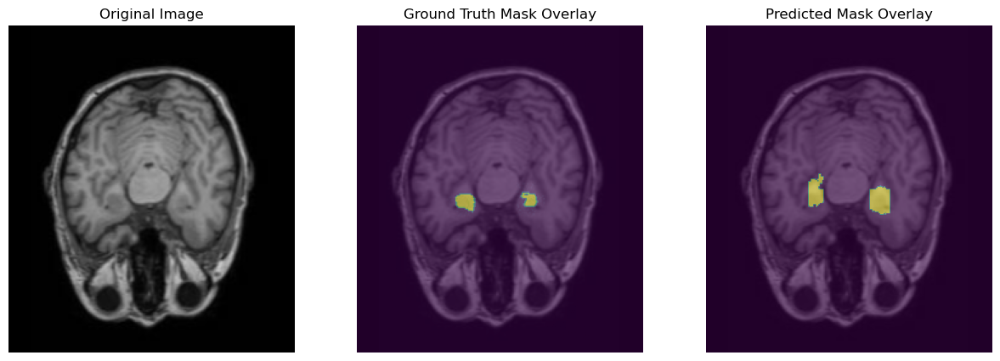

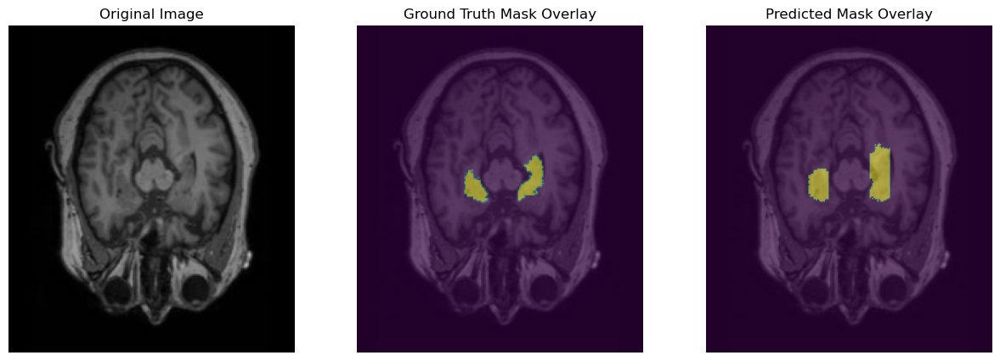

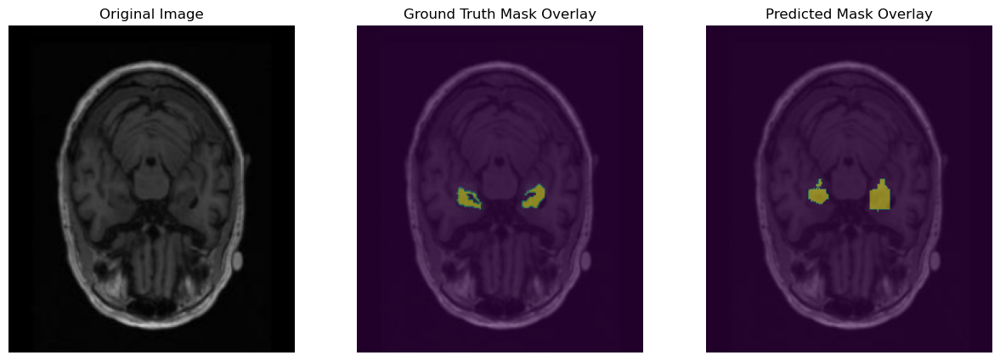

In [143]:
num_examples = 5

for i in range(num_examples):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.title('Original Image')
    plt.axis("off")
    
    if y_val is not None:
        plt.subplot(1, 3, 2)
        plt.imshow(X_val[i].squeeze(), cmap='gray')
        plt.imshow(y_val[i].squeeze(), cmap='viridis', alpha=0.5)  
        plt.title('Ground Truth Mask Overlay')
        plt.axis("off")
    
    plt.subplot(1, 3, 3)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.imshow(vnet_val_predictions[i].squeeze(), cmap='viridis', alpha=0.5) 
    plt.title('Predicted Mask Overlay')
    plt.axis("off")

plt.show()

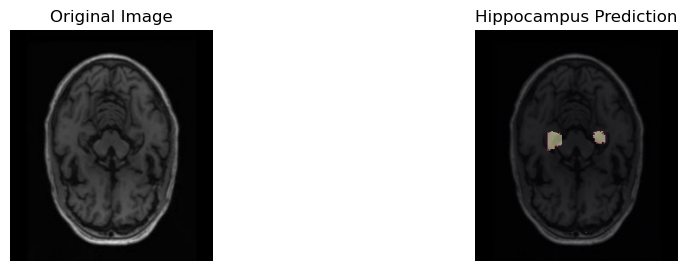

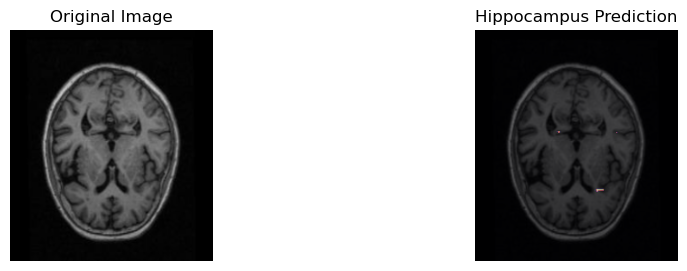

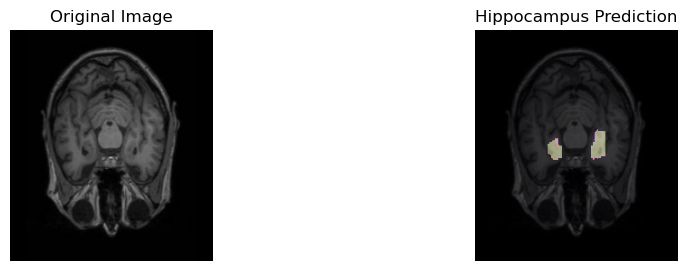

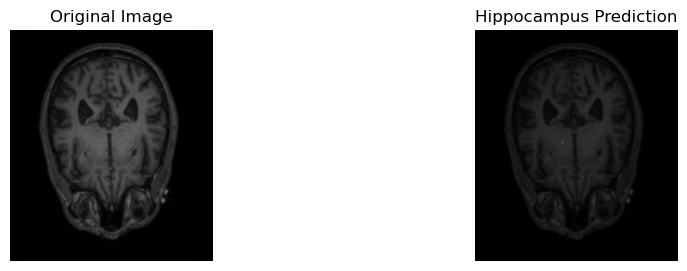

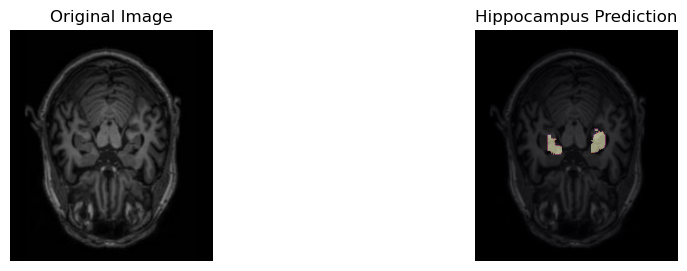

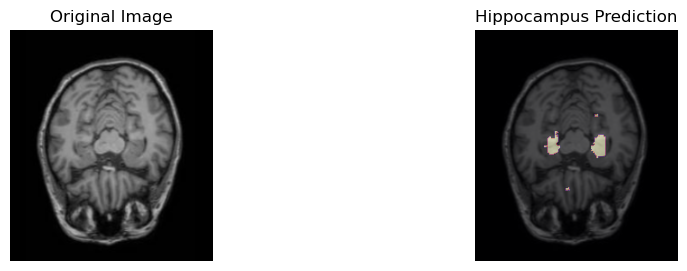

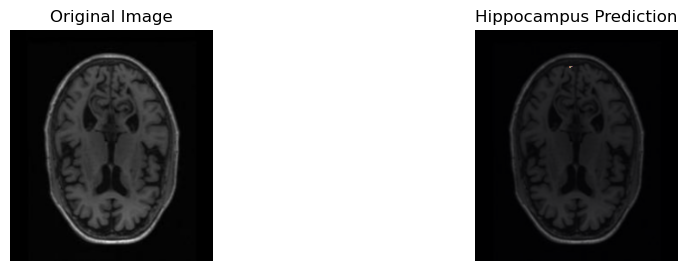

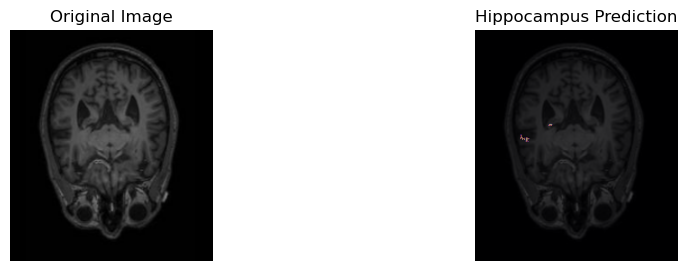

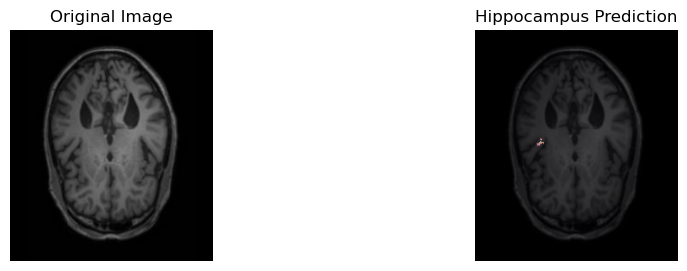

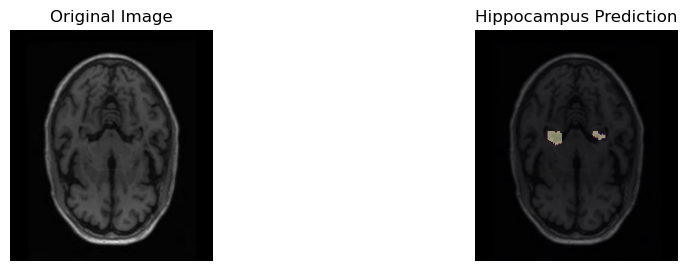

In [146]:
num_examples = 10 
indices = np.random.choice(len(X_val), num_examples, replace=False)  

for i in indices:
    plt.figure(figsize=(11, 3))

    plt.subplot(1, 2, 1)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.title('Original Image')
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    plt.imshow(X_val[i].squeeze(), cmap='gray')
    plt.imshow(vnet_val_predictions[i].squeeze(), cmap='magma', alpha=0.5) 
    plt.title('Hippocampus Prediction')
    plt.axis("off")

plt.show()
